<hr><font color="green"><h1>from file: 2.electricity-consumption-forecast-with-xgboost</h1></font>

In [1]:
import pandas as pd 
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt 
%matplotlib inline 

from datetime import datetime
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error

import seaborn as sns
#sns.set(rc={"axes.facecolor":"Beige" , "axes.grid" : False})
plt.rcParams["figure.figsize"] = (20, 6)
params = {'axes.labelsize': 18, 'axes.titlesize': 22, 'font.size': 17}
plt.rcParams.update(params)

import warnings
warnings.filterwarnings("ignore")

In [3]:
df = pd.read_csv("data/electricity-consumption.csv")
df = df.fillna(method = 'ffill')
df['time'] = pd.to_datetime(df['time'])
df.head(2) 

,time,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3,Precipitation,CloudCover,Temperature,Snowfall,Wind
0,2007-01-01 00:00:00,2.537017,0.092217,241.228917,10.486667,0.0,0.291667,0.0,1.329846e-07,0.999695,286.43298,0.0,9.663516
1,2007-01-01 02:00:00,2.562000,0.098383,243.232917,10.470000,0.0,0.300000,0.0,2.353721e-07,0.556274,285.98602,0.0,8.988889


In [5]:
df1 = df.copy('Deep')

df1 = df1.rename(columns = {'time' : 'Datetime'})

df1 = df1.set_index('Datetime')
df1.index = pd.to_datetime(df1.index,infer_datetime_format = True)
df1.head()

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3,Precipitation,CloudCover,Temperature,Snowfall,Wind
Datetime,,,,,,,,,,,,
2007-01-01 00:00:00,2.537017,0.092217,241.228917,10.486667,0.0,0.291667,0.000000,1.329846e-07,0.999695,286.43298,0.0,9.663516
2007-01-01 02:00:00,2.562000,0.098383,243.232917,10.470000,0.0,0.300000,0.000000,2.353721e-07,0.556274,285.98602,0.0,8.988889
2007-01-01 04:00:00,2.475983,0.094917,242.402417,10.130000,0.0,0.291667,0.000000,3.708734e-09,0.164459,284.50214,0.0,6.604268
2007-01-01 06:00:00,2.451500,0.096500,240.768000,10.111667,0.0,0.275000,0.000000,0.000000e+00,0.197144,283.30905,0.0,7.486063
2007-01-01 08:00:00,2.793933,0.072850,240.461000,11.550000,0.0,0.025000,6.016667,2.053049e-08,0.172791,282.31317,0.0,8.071110


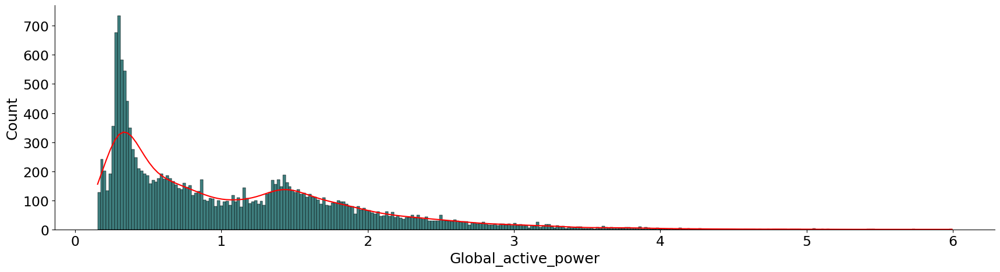

In [7]:
sns.displot(data=df1, x="Global_active_power", kde=True, bins = 300,color = "red", facecolor = "#3F7F7F",height = 5, aspect = 3.5);

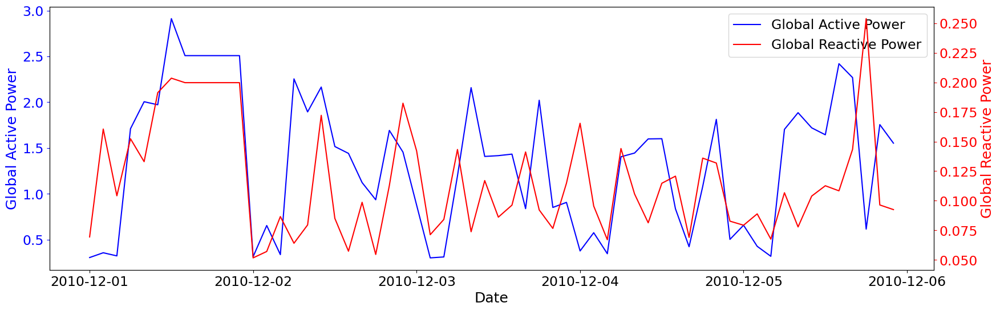

In [9]:
df2 = df1.copy('Deep')

dfx = df2[["Global_active_power", "Global_reactive_power"]]["2010-12-01" : "2010-12-05 "]

fig, ax1 = plt.subplots(figsize=(20,6))
ax1.plot(dfx.index, dfx['Global_active_power'], 'b', label='Global Active Power')
ax1.set_xlabel('Date')
ax1.set_ylabel('Global Active Power', color='b')
ax1.tick_params('y', colors='b')

ax2 = ax1.twinx()

ax2.plot(dfx.index, dfx['Global_reactive_power'], 'r', label='Global Reactive Power')
ax2.set_ylabel('Global Reactive Power', color='r')
ax2.tick_params('y', colors='r')

lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
lines = lines1 + lines2
labels = labels1 + labels2
ax1.legend(lines, labels, loc='upper right')
plt.show()

Train:	 14595
Test:	 2700


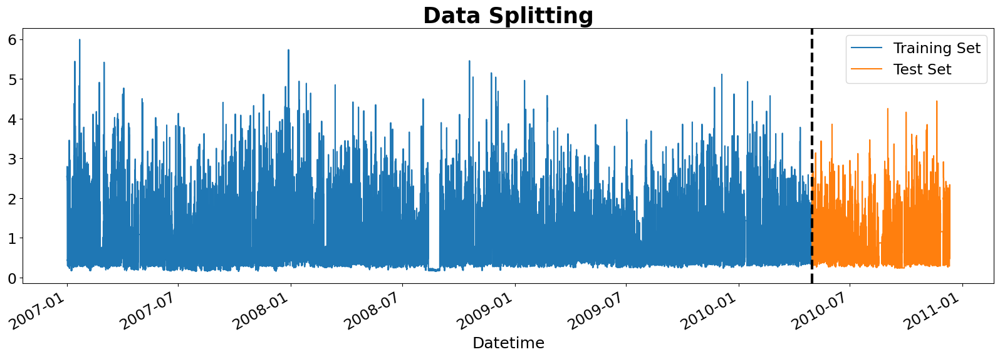

In [11]:
# Before building and training our model, let's split the data into training and testing
train, test = df2[df2.index < '2010-05-01'], df2[df2.index >= '2010-05-01']

print('Train:\t', len(train))
print('Test:\t', len(test))

plt.figure(figsize=(20,6))

train['Global_active_power'].plot(label='Training Set')
test['Global_active_power'].plot(label='Test Set');
plt.axvline('2010-05-01', color='black', ls='--', lw=3)
plt.title('Data Splitting', weight='bold', fontsize=25)
plt.legend();

In [13]:
def create_features(df):
    '''create time series features from the index '''
    
    df['hour'] = df.index.hour
    df['day_of_week'] = df.index.dayofweek
    df['quarter'] = df.index.quarter
    df['month'] = df.index.month
    df['day_of_month'] = df.index.day
    df['day_of_year'] = df.index.dayofyear
    df['week_of_year'] = df.index.isocalendar().week
    
    return df
create_features(df2)

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3,Precipitation,CloudCover,Temperature,Snowfall,Wind,hour,day_of_week,quarter,month,day_of_month,day_of_year,week_of_year
Datetime,,,,,,,,,,,,,,,,,,,
2007-01-01 00:00:00,2.537017,0.092217,241.228917,10.486667,0.000,0.291667,0.000000,1.329846e-07,0.999695,286.43298,0.0,9.663516,0,0,1,1,1,1,1
2007-01-01 02:00:00,2.562000,0.098383,243.232917,10.470000,0.000,0.300000,0.000000,2.353721e-07,0.556274,285.98602,0.0,8.988889,2,0,1,1,1,1,1
2007-01-01 04:00:00,2.475983,0.094917,242.402417,10.130000,0.000,0.291667,0.000000,3.708734e-09,0.164459,284.50214,0.0,6.604268,4,0,1,1,1,1,1
2007-01-01 06:00:00,2.451500,0.096500,240.768000,10.111667,0.000,0.275000,0.000000,0.000000e+00,0.197144,283.30905,0.0,7.486063,6,0,1,1,1,1,1
2007-01-01 08:00:00,2.793933,0.072850,240.461000,11.550000,0.000,0.025000,6.016667,2.053049e-08,0.172791,282.31317,0.0,8.071110,8,0,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2010-12-11 14:00:00,1.555850,0.168850,236.979333,6.818333,0.000,0.258333,10.625000,0.000000e+00,1.000000,278.62927,0.0,1.694674,14,5,4,12,11,345,49
2010-12-11 16:00:00,1.908883,0.191567,233.290500,8.260000,0.000,0.608333,5.958333,1.589457e-09,1.000000,278.68933,0.0,0.930473,16,5,4,12,11,345,49
2010-12-11 18:00:00,2.336417,0.105783,231.377417,10.098333,0.175,0.000000,6.566667,1.298057e-08,1.000000,278.19742,0.0,0.700579,18,5,4,12,11,345,49


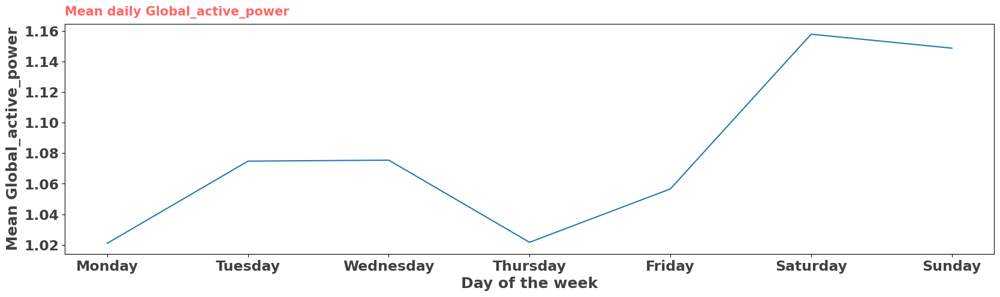

In [15]:
mean_per_day = df2.groupby("day_of_week")["Global_active_power"].agg(["mean"])

fig, ax = plt.subplots(figsize=(20,5))
plt.plot(mean_per_day.index,mean_per_day["mean"])

plt.xticks(mean_per_day.index, ["Monday","Tuesday", "Wednesday", "Thursday", "Friday", "Saturday","Sunday"], alpha=0.75, weight="bold")
plt.yticks(alpha=0.75, weight="bold")
plt.xlabel("Day of the week",alpha=0.75, weight="bold")
plt.ylabel("Mean Global_active_power",alpha=0.75, weight="bold")
plt.title("Mean daily Global_active_power", alpha=0.60, weight="bold", fontsize=15, loc="left", pad=10,color='Red');
del mean_per_day

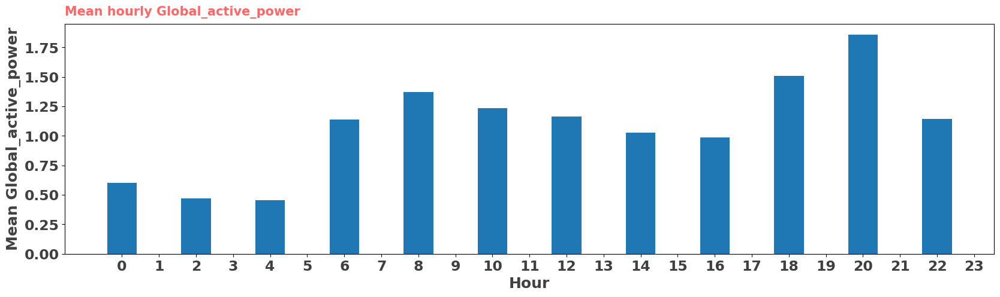

In [17]:
mean_per_hour = df2.groupby("hour")["Global_active_power"].agg(["mean"])

fig, ax = plt.subplots(figsize=(20,5))

plt.bar(mean_per_hour.index, mean_per_hour["mean"])

plt.xticks(range(24),alpha=0.75, weight="bold")
plt.yticks(alpha=0.75, weight="bold")
plt.xlabel("Hour",alpha=0.75, weight="bold")
plt.ylabel("Mean Global_active_power",alpha=0.75, weight="bold")
plt.title("Mean hourly Global_active_power", alpha=0.60, weight="bold", fontsize=15, loc="left", pad=10,color="Red")

del mean_per_hour


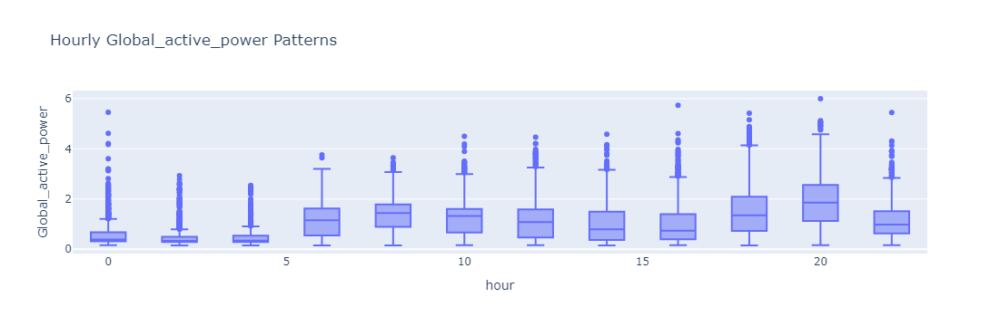

In [19]:
import plotly.express as px
import plotly.graph_objects as go
fig = px.box(df2, x='hour', y='Global_active_power', title='Hourly Global_active_power Patterns')
fig.show()

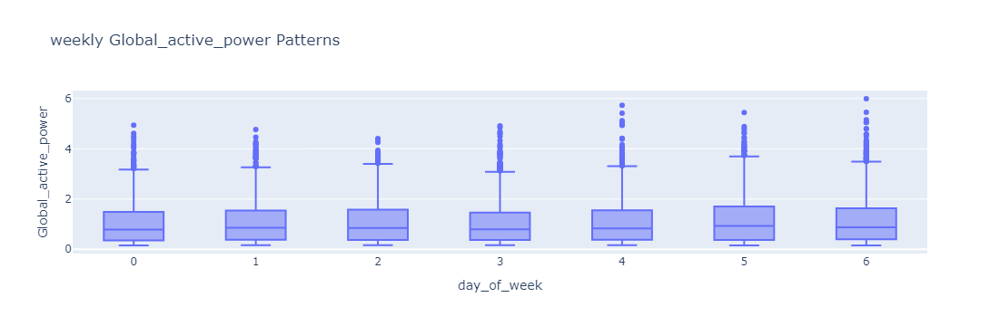

In [21]:
fig = px.box(df2, x='day_of_week', y='Global_active_power', title='weekly Global_active_power Patterns')
fig.show()

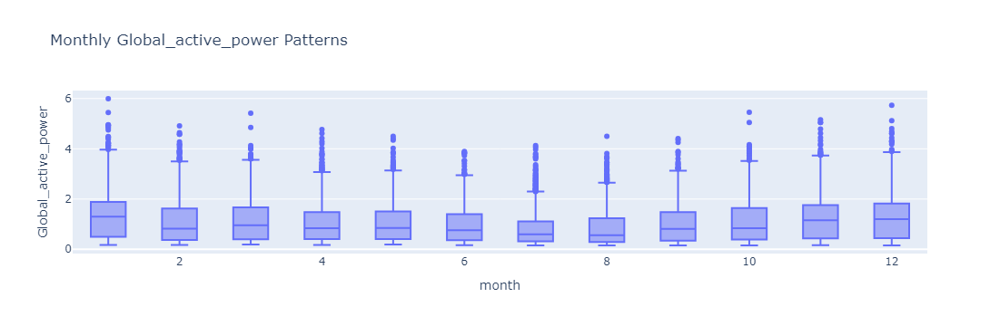

In [23]:
fig = px.box(df2, x='month', y='Global_active_power', title='Monthly Global_active_power Patterns')
fig.show()

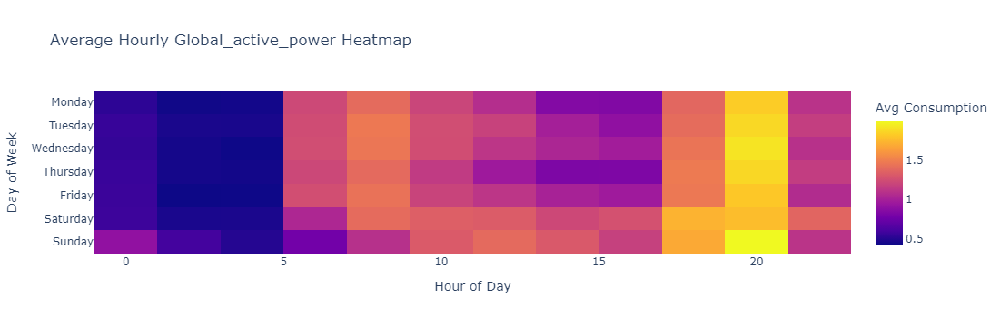

In [25]:
import pandas as pd
import plotly.express as px

# Assuming your data is in a DataFrame named 'df2'

# Group data by day of week and hour, calculate mean of 'Global_active_power', reset index
hourly_avg = df2.groupby(['day_of_week', 'hour']).mean()['Global_active_power'].reset_index()

# Create pivot table with day of week as rows and hour as columns
hourly_avg = hourly_avg.pivot_table(index='day_of_week', columns='hour', values='Global_active_power')

# Create heatmap using px.imshow
fig = px.imshow(hourly_avg,
                 labels=dict(x="Hour of Day", y="Day of Week", color="Avg Consumption"),
                 # No explicit x needed as labels are inferred from column names
                 y=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'],
                 title='Average Hourly Global_active_power Heatmap')

# Display the heatmap
fig.show()


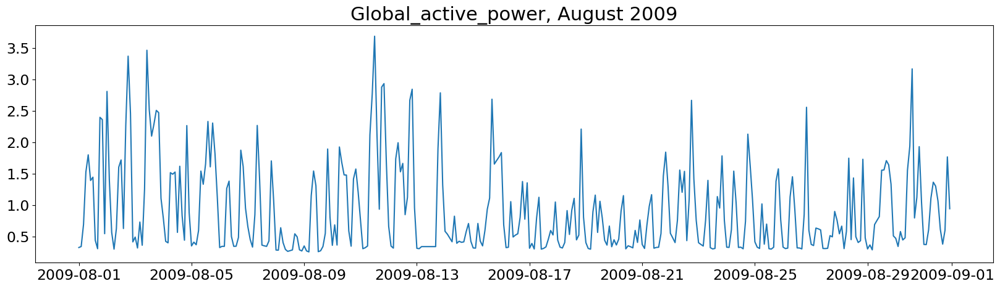

In [27]:
plt.figure(figsize=(20,5))
plt.plot(df2[(df2.index.year==2009) & (df2.index.month==8)]['Global_active_power'])
plt.title('Global_active_power, August 2009')
plt.show()

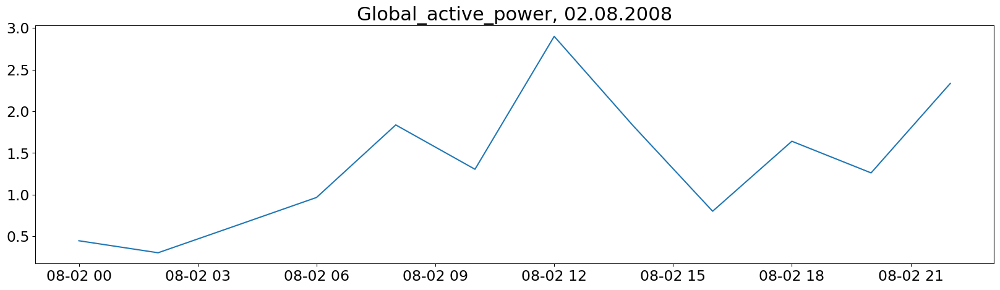

In [29]:
plt.figure(figsize=(20,5))
plt.plot(df2[(df2.index.year==2008) & (df2.index.month==8) & (df2.index.day==2)]['Global_active_power'])
plt.title('Global_active_power, 02.08.2008')
plt.show()

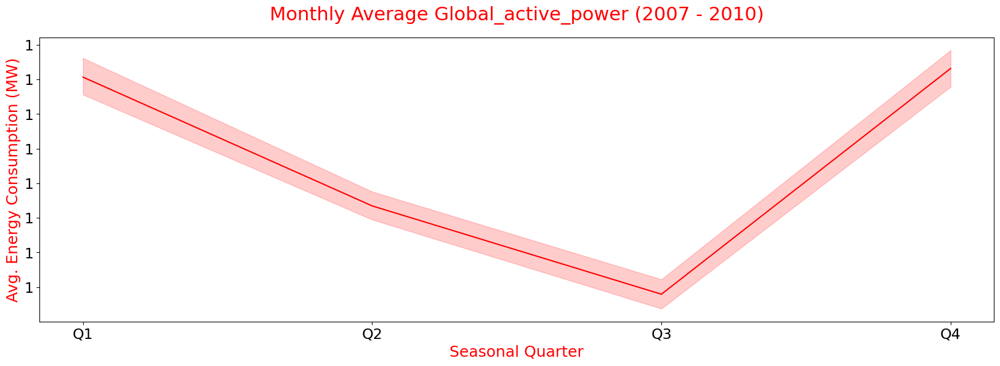

In [31]:
from matplotlib import ticker
fig, ax = plt.subplots(figsize=(20,6))
sns.lineplot(ax=ax, data=df2, x='quarter', y='Global_active_power', ci=95,color="red")
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
ax.set_xticks([1,2,3,4])
ax.set_xticklabels(['Q1', 'Q2', 'Q3', 'Q4'])
ax.set_ylabel('Avg. Energy Consumption (MW)',color="red")
ax.set_xlabel('Seasonal Quarter',color='Red')
ax.set_title('Monthly Average Global_active_power (2007 - 2010)',color='Red',pad=20)
plt.show()

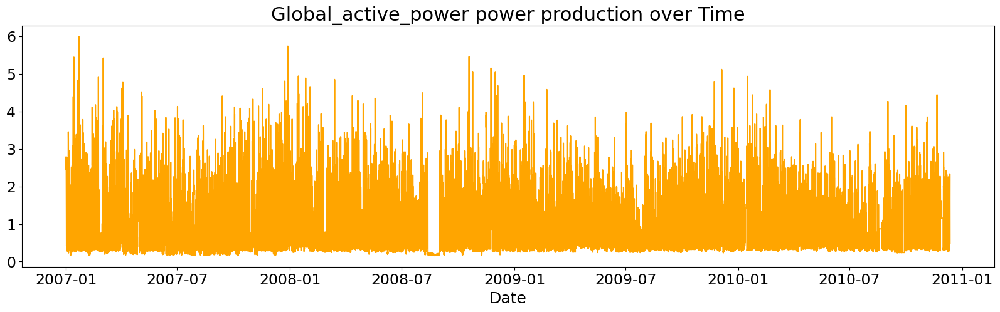

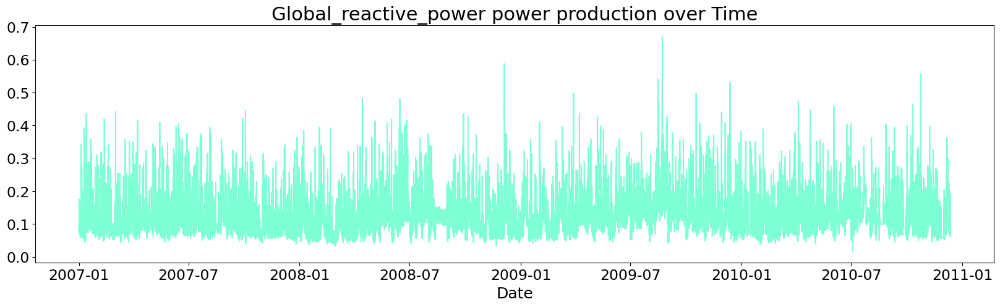

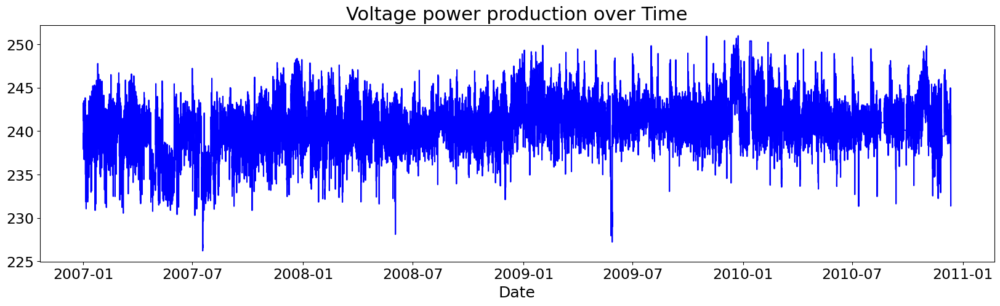

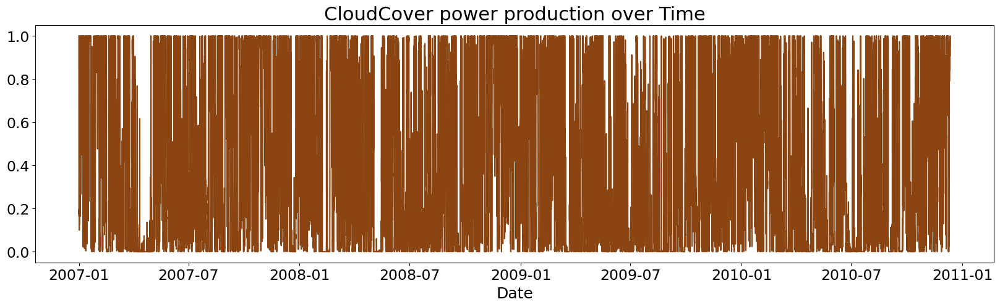

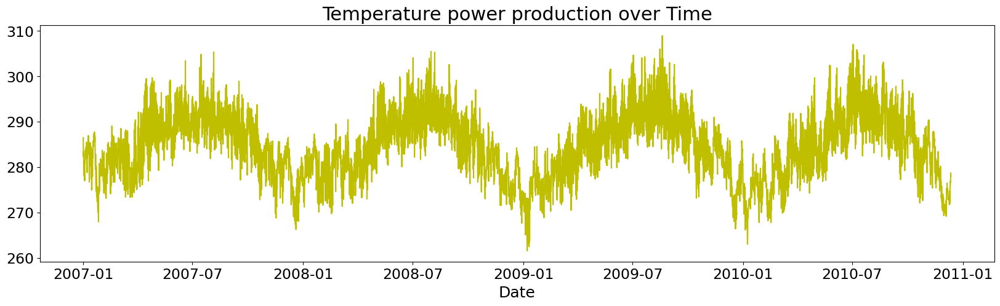

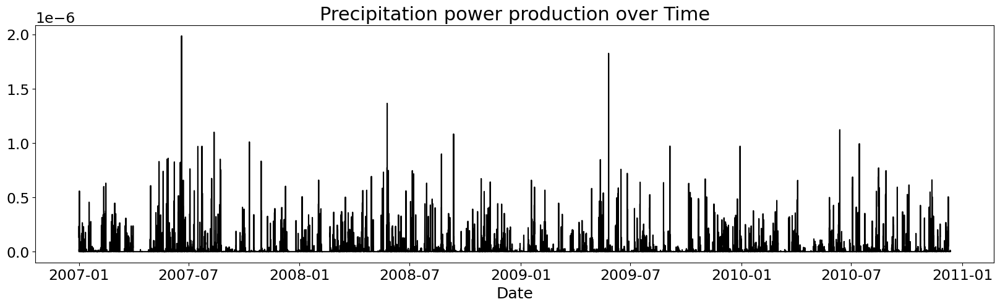

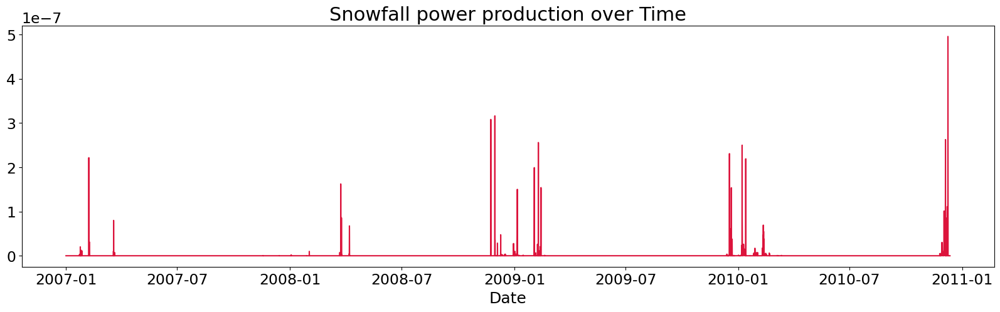

In [33]:
Types =['Global_active_power','Global_reactive_power','Voltage','CloudCover','Temperature','Precipitation','Snowfall']

colors = {'Global_active_power':'orange', 'Global_reactive_power':'aquamarine', 'Voltage':'b', 'CloudCover':'saddlebrown', 'Precipitation':'black', 'Temperature':'y', 'Snowfall':'crimson'}
for prType in Types:
    plt.figure(figsize=(20,5))
    plt.plot(df2.index, df2[prType], color=colors.get(prType))
    plt.title(f'{prType} power production over Time')
    plt.xlabel('Date')
    plt.ylabel('')
    plt.show()

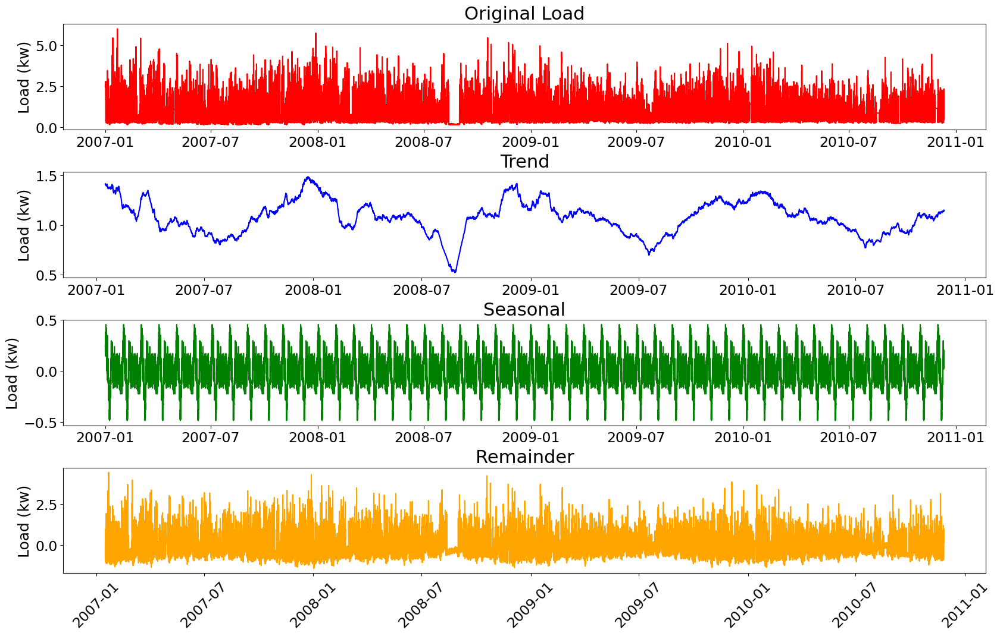

In [34]:
from statsmodels.tsa.seasonal import seasonal_decompose

df3 = df2[['Global_active_power']]
# Decompose the data
decomposition = seasonal_decompose(df3, period=365)

# Extract components
trend = decomposition.trend
seasonal = decomposition.seasonal
remainder = decomposition.resid
original = df3['Global_active_power']  # Assuming 'Grid_load_forecast' is the column name

# Create a figure with 4 subplots (original on top, others stacked below)
fig, axes = plt.subplots(4, 1, figsize=(20, 12), gridspec_kw={'hspace': 0.4})  # Adjust figsize as needed

# Plot original on top subplot
axes[0].plot(original, color='red', label='Original Load')
axes[0].set(ylabel='Load (kw)', title='Original Load')

# Plot remaining components on stacked subplots
axes[1].plot(trend, color='blue', label='Trend')
axes[1].set(ylabel='Load (kw)', title='Trend')
axes[2].plot(seasonal, color='green', label='Seasonal')
axes[2].set(ylabel='Load (kw)', title='Seasonal')
axes[3].plot(remainder, color='orange', label='Remainder')
axes[3].set(ylabel='Load (kw)', title='Remainder')

# Add legend to the bottom subplot (optional)
# axes[3].legend()  # Uncomment to show legend

# Rotate x-axis labels for bottom subplot
plt.setp(axes[-1].xaxis.get_majorticklabels(), rotation=45)

plt.tight_layout()  # Adjust spacing between subplots
plt.show()


In [36]:
train = df2.loc[df2.index < '2010-05-01']
test = df2.loc[df2.index >= '2010-05-01']

# training set
X_train = train.drop(columns = ['Global_active_power'])
y_train = train['Global_active_power']

# test dataframe
X_test = test.drop(columns = ['Global_active_power'])
y_test = test['Global_active_power']

In [37]:
X_train.dtypes

Global_reactive_power    float64
Voltage                  float64
Global_intensity         float64
Sub_metering_1           float64
Sub_metering_2           float64
Sub_metering_3           float64
Precipitation            float64
CloudCover               float64
Temperature              float64
Snowfall                 float64
Wind                     float64
hour                       int32
day_of_week                int32
quarter                    int32
month                      int32
day_of_month               int32
day_of_year                int32
week_of_year              UInt32
dtype: object

In [38]:
X_train['week_of_year'] = X_train['week_of_year'].astype(np.float64)
X_test['week_of_year'] = X_test['week_of_year'].astype(np.float64)

In [43]:
parameters = {'n_estimators': [5, 10, 100, 1000],
             'max_depth': [2, 4, 6, 8],
             'learning_rate': [0.01, 0.1, 1],
              'max_leaves': [2, 4, 6, 8]
             }

In [45]:
from xgboost import XGBRegressor
from xgboost import plot_importance

model = XGBRegressor()
clf = GridSearchCV(model, parameters, n_jobs = 5, scoring = 'neg_mean_squared_error')

In [46]:
clf.fit(X_train, y_train) 

GridSearchCV(estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, max_bi...
                                    max_cat_to_onehot=None, max_delta_step=None,
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=None, ...),
             n_jobs=5,
             param_grid={'learning_rate': [0.01, 0.1, 1],
                         'max_depth': [2, 4, 6, 8], 'max_leaves': [2, 4, 6, 8],
                         'n_estimators': [5, 10, 100, 1000]},
             scoring='neg_mean_squared_error')

In [48]:
#### print('best parameters: ', clf.best_params_)
print('best score: ', clf.best_score_)

best score:  -0.0011548399079678473


In [49]:
parameters = {'learning_rate': [0.01], 
              'max_depth': [4], 
              'max_leaves': [6], 
              'n_estimators': [1000]}
model = XGBRegressor()
clf = GridSearchCV(model, parameters, n_jobs = 5, scoring = 'neg_mean_squared_error')
clf.fit(X_train, y_train)

GridSearchCV(estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, max_bi...
                                    max_cat_to_onehot=None, max_delta_step=None,
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=None, ...),
             n_jobs=5,
             param_grid={'learning_rate': [0.01], 'max_depth': [4],
                         'max_leaves': [6], 'n_estimators': [1000]},
             scoring='neg_mean_squared_error')

In [50]:
# Predictions
y_preds = clf.predict(X_test)

In [51]:
print(mean_absolute_error(y_test, y_preds))

0.012918840826368284


In [52]:
reg = XGBRegressor(learning_rate= 0.01, 
              max_depth= 4, 
              max_leaves = 6, 
              n_estimators = 1500)
reg.fit(X_train, y_train)
print(reg.feature_importances_)

[7.6310051e-04 1.0205489e-03 9.8787147e-01 8.2922145e-04 8.0584479e-04
 1.9181436e-03 1.3598254e-04 2.1772843e-03 1.4690063e-03 0.0000000e+00
 6.0532312e-04 4.8339268e-04 3.3252817e-04 0.0000000e+00 2.9791321e-04
 7.0385425e-04 2.7796044e-04 3.0829606e-04]


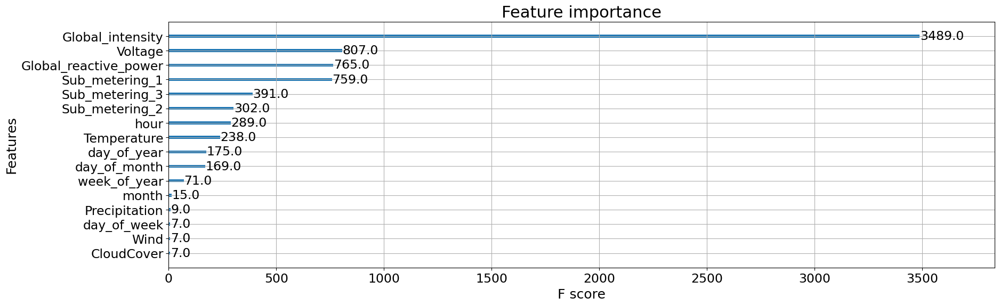

In [53]:
from pylab import rcParams
rcParams['figure.figsize'] = 20, 6 #Changes default matplotlib plots to this size
plot_importance(reg)
plt.show();

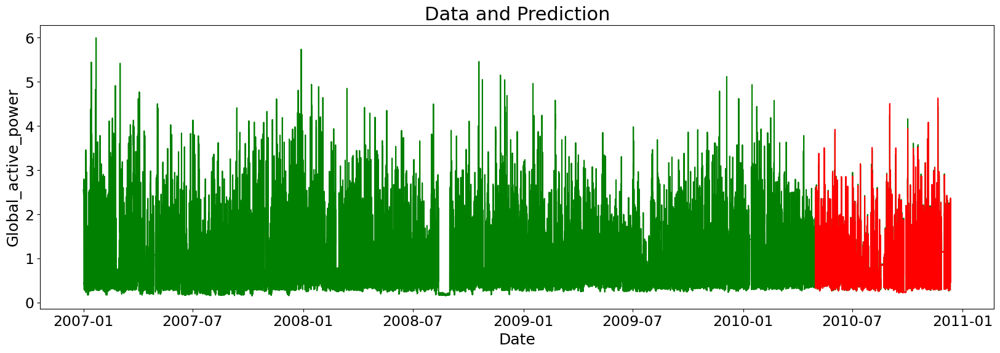

In [54]:
plt.figure(figsize=(20, 6))
sns.lineplot(x= df2.index, y = 'Global_active_power', data=df2, color = 'Green') #test data 
sns.lineplot(x = X_test.index, y = y_preds, color = 'Red') # predictions
plt.title('Data and Prediction')
plt.ylabel('Global_active_power')
plt.xlabel('Date')
plt.show()

In [55]:
test.head(2)

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3,Precipitation,CloudCover,Temperature,Snowfall,Wind,hour,day_of_week,quarter,month,day_of_month,day_of_year,week_of_year
Datetime,,,,,,,,,,,,,,,,,,,
2010-05-01 00:00:00,0.38185,0.092850,245.66875,1.638333,0.0,0.341667,0.683333,0.0,0.277313,283.3215,0.0,1.928284,0,5,2,5,1,121,17
2010-05-01 02:00:00,0.35465,0.065533,246.98275,1.488333,0.0,0.000000,0.691667,0.0,0.476318,282.9030,0.0,1.785424,2,5,2,5,1,121,17


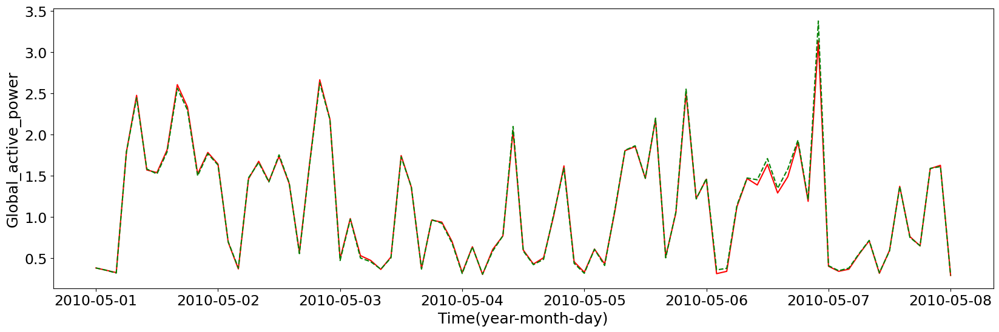

In [56]:
# making a copy of test set
test_copy = test.copy()
# adding predictions to the dataframe
test_copy['predictions'] = y_preds
# slicing a week of the data set
fw = test_copy.loc[(test_copy.index <= '2010-05-08')]

# Plotting
plt.figure(figsize=(20, 6))
sns.lineplot(data = fw, x = fw.index, y='Global_active_power', color = 'Red') # actual values
sns.lineplot(data = fw, x = fw.index, y = 'predictions', color = 'Green', linestyle = 'dashed') # predicted values
plt.ylabel('Global_active_power')
plt.xlabel('Time(year-month-day)')
plt.show()

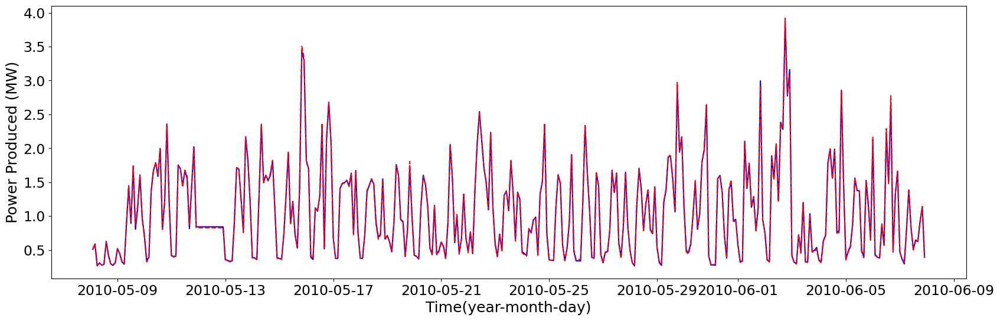

In [57]:
# slicing a week of the data set
fm = test_copy.loc[(test_copy.index > '2010-05-08') & (test_copy.index < '2010-06-08')]
# Plotting
plt.figure(figsize=(20, 6))
sns.lineplot(data = fm, x = fm.index, y='Global_active_power', color = 'blue') # actual values
sns.lineplot(data = fm, x = fm.index, y = 'predictions', color = 'Red', linestyle = 'dashed') # predicted values
plt.ylabel('Power Produced (MW)')
plt.xlabel('Time(year-month-day)')
plt.show()

In [58]:
result = test_copy.loc[(test_copy.index > '2010-05-08') & (test_copy.index < '2010-05-25'), ('Global_active_power', 'predictions')]
result.head(20)

,Global_active_power,predictions
Datetime,,
2010-05-08 02:00:00,0.509483,0.509999
2010-05-08 04:00:00,0.588733,0.590377
2010-05-08 06:00:00,0.265517,0.265720
2010-05-08 08:00:00,0.308883,0.311343
2010-05-08 10:00:00,0.275067,0.276304
2010-05-08 12:00:00,0.288383,0.287734
2010-05-08 14:00:00,0.627283,0.618904
2010-05-08 16:00:00,0.420067,0.419339
2010-05-08 18:00:00,0.294783,0.295637


In [59]:
result['Error'] = result['Global_active_power'] - result['predictions']
result.head(20)

,Global_active_power,predictions,Error
Datetime,,,
2010-05-08 02:00:00,0.509483,0.509999,-0.000515
2010-05-08 04:00:00,0.588733,0.590377,-0.001643
2010-05-08 06:00:00,0.265517,0.265720,-0.000203
2010-05-08 08:00:00,0.308883,0.311343,-0.002459
2010-05-08 10:00:00,0.275067,0.276304,-0.001237
2010-05-08 12:00:00,0.288383,0.287734,0.000650
2010-05-08 14:00:00,0.627283,0.618904,0.008379
2010-05-08 16:00:00,0.420067,0.419339,0.000728
2010-05-08 18:00:00,0.294783,0.295637,-0.000853


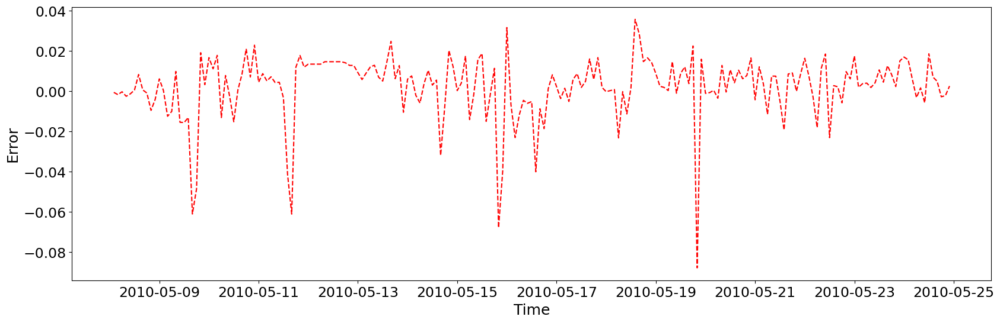

In [60]:
plt.figure(figsize=(20, 6))
sns.lineplot(data = result, x = result.index, y = 'Error', color = 'Red', linestyle = 'dashed') # predicted values
plt.ylabel('Error')
plt.xlabel('Time')
plt.show()

# Anomaly Detection 

In [62]:
df3 = df.copy('Deep')

df3 = df3.rename(columns = {'time' : 'Datetime'})
df3.head()

,Datetime,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3,Precipitation,CloudCover,Temperature,Snowfall,Wind
0,2007-01-01 00:00:00,2.537017,0.092217,241.228917,10.486667,0.0,0.291667,0.000000,1.329846e-07,0.999695,286.43298,0.0,9.663516
1,2007-01-01 02:00:00,2.562000,0.098383,243.232917,10.470000,0.0,0.300000,0.000000,2.353721e-07,0.556274,285.98602,0.0,8.988889
2,2007-01-01 04:00:00,2.475983,0.094917,242.402417,10.130000,0.0,0.291667,0.000000,3.708734e-09,0.164459,284.50214,0.0,6.604268
3,2007-01-01 06:00:00,2.451500,0.096500,240.768000,10.111667,0.0,0.275000,0.000000,0.000000e+00,0.197144,283.30905,0.0,7.486063
4,2007-01-01 08:00:00,2.793933,0.072850,240.461000,11.550000,0.0,0.025000,6.016667,2.053049e-08,0.172791,282.31317,0.0,8.071110


In [63]:
df4 = df3[['Datetime','Global_active_power']]

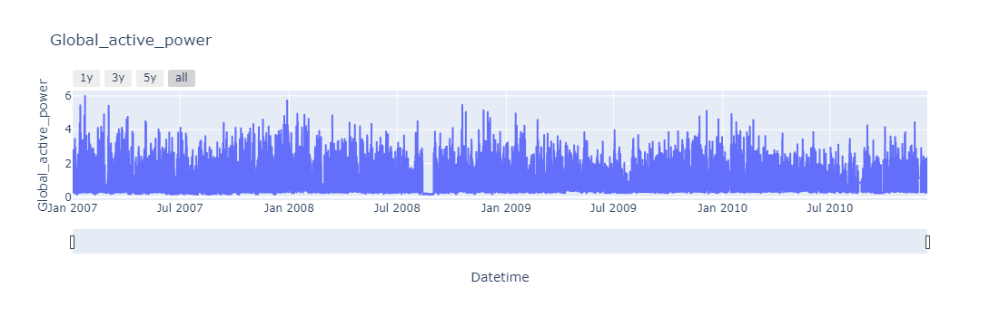

In [64]:
import plotly.express as px

fig = px.line(df4, x= 'Datetime', y= 'Global_active_power', title= 'Global_active_power')

fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector = dict(
        buttons= list([
            dict(count=1,label='1y', step='year', stepmode='backward'),
            dict(count=2,label='3y', step='year', stepmode='backward'),
            dict(count=3,label='5y', step='year', stepmode='backward'),
            dict(step = 'all')
        ])
    )
)

fig.show()

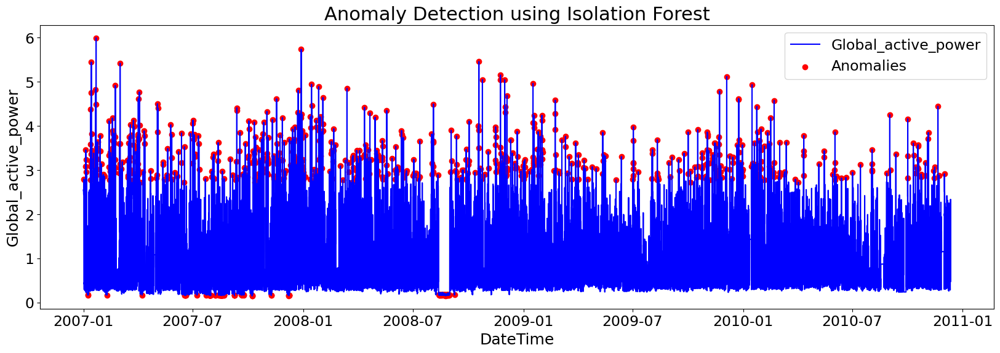

In [65]:
from sklearn.ensemble import IsolationForest

# Preprocessing: Convert 'DateTime' column to datetime format
df4['Datetime'] = pd.to_datetime(df4['Datetime'])

# Feature selection: We'll use only the 'Cost(€/MWh)' column for anomaly detection
X = df4[['Global_active_power']]

# Initialize the Isolation Forest model
model = IsolationForest(contamination=0.05, random_state=42)  # Adjust contamination as needed

# Fit the model
model.fit(X)

# Predict anomalies (1 for normal, -1 for anomalies)
df4['Anomaly'] = model.predict(X)

# Visualize anomalies
plt.figure(figsize=(20, 6))
plt.plot(df4['Datetime'], df4['Global_active_power'], label='Global_active_power',color='Blue')
plt.scatter(df4['Datetime'][df4['Anomaly'] == -1], df4['Global_active_power'][df4['Anomaly'] == -1], color='red', label='Anomalies')
plt.xlabel('DateTime')
plt.ylabel('Global_active_power')
plt.title('Anomaly Detection using Isolation Forest')
plt.legend()
plt.show()

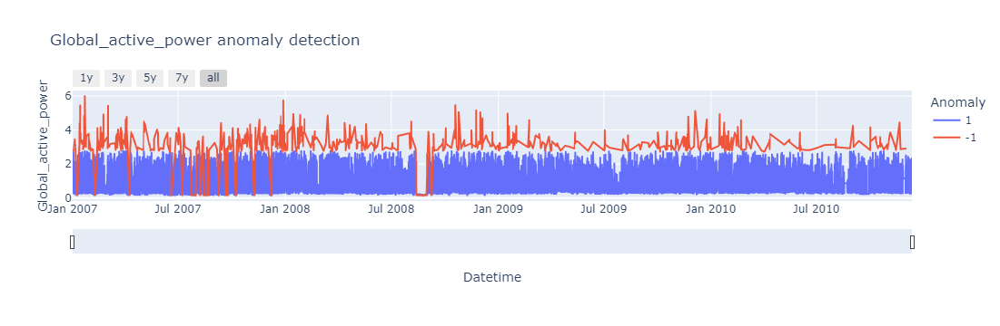

In [66]:
import plotly.express as px

fig = px.line(df4, x= df4['Datetime'], y= 'Global_active_power',color= 'Anomaly', title= 'Global_active_power anomaly detection')

fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector = dict(
        buttons= list([
            dict(count=1,label='1y', step='year', stepmode='backward'),
            dict(count=2,label='3y', step='year', stepmode='backward'),
            dict(count=3,label='5y', step='year', stepmode='backward'),
            dict(count=4,label='7y', step='year', stepmode='backward'),
            dict(step = 'all')
        ])
    )
)

fig.show()